# Diabetes classification using sklearn

ดร.ไพรสันต์  ผดุงเวียง <br>
Dr.Praisan Padungweang

2024

# Outline

 เนื้อหา
* Data understanding
* Missing value
* Normailzation
* Classification
* GridsearchCV
* Pipeline
* Save and load model


## Data preparation

In [1]:
## automatic EDA
## https://github.com/ydataai/ydata-profiling
!pip install ydata-profiling --quiet
# https://pub.towardsai.net/5-python-packages-for-effortless-eda-94abddac3bc5
!pip install jupyter-summarytools --quiet
exit()

: 

# EDA

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from summarytools import dfSummary

In [2]:
%matplotlib inline
sns.set_style('darkgrid')

In [3]:
raw_data = pd.read_csv('https://github.com/praisan/hello-world/raw/master/diabetes.csv')
raw_data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [4]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [5]:
profile = ProfileReport(raw_data, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

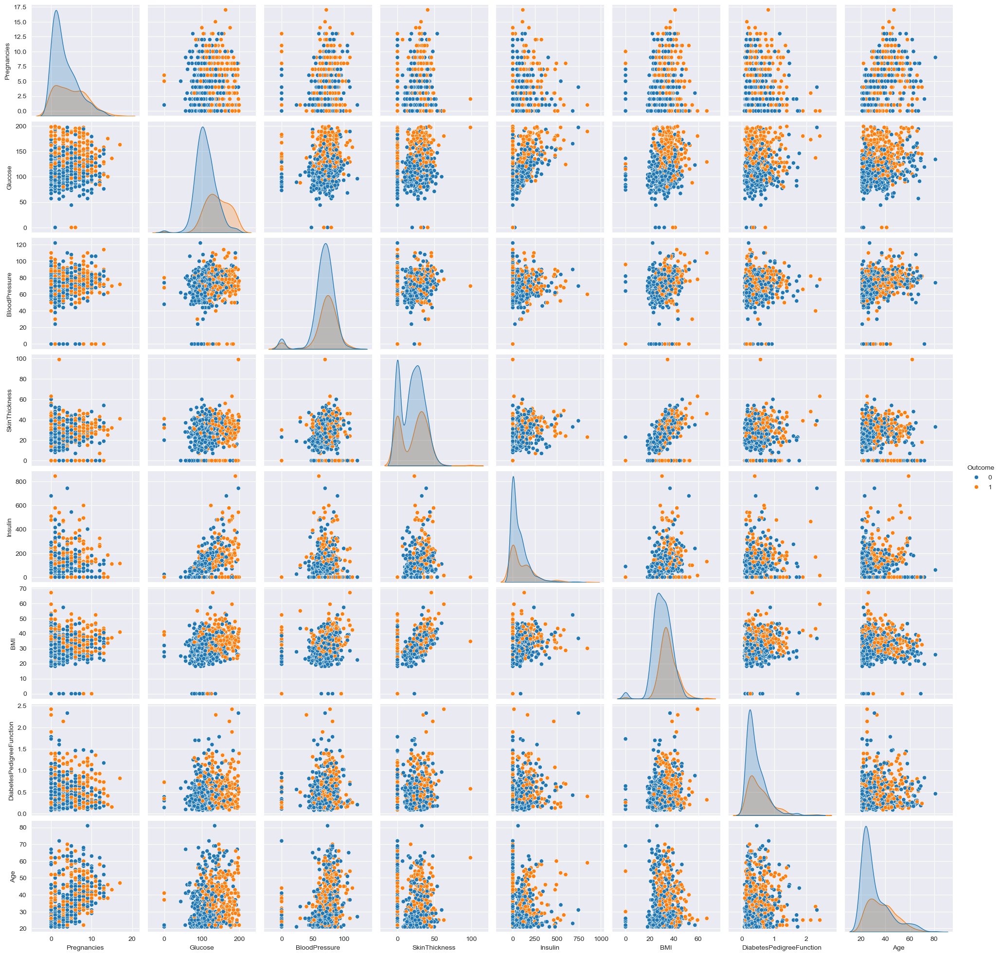

In [4]:
sns.pairplot(raw_data, hue="Outcome")

In [ ]:
dfSummary(raw_data)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,Pregnancies[int64],Mean (sd) : 3.8 (3.4)min < med < max:0.0 < 3.0 < 17.0IQR (CV) : 5.0 (1.1),17 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACiklEQVR4nO3dTW7aQBiA4W9KAPNTWwgJdlygUhcsfYgettvusuAE3IANQkJghBMHY9xNqSqVBPCEMN/kfdaZMYtXQWPPYFOWpQCu+3LvDwBc4uHcHxhjWiLSqDj/rizL54pjgb/eDNUY0+r3+z/CMOxVmXyz2ayMMT+JFbbO/UdthGHYi+P4OYqi7JqJkyQJJpNJb7lcNkSEUGHl7Fe/iEgURdlgMHiqMH+rwhjgPyymoAKhQgVChQqEChUIFSoQKlQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUIFSocNF+1KqKoqiLSGiMqToFR1kgIjcMNU3Tep7n30ejUa1Wq111OuCIoyw4ulmou93uIQiC9ng8zobD4era8Rxlwb9u+tUvItLpdKoeYxHhKAv+YDEFFQgVKhAqVCBUqECoUIFQoQKhQgVChQqEChUIFSrc/BGqDcvdV+y88oizodruvmLnlV+cDdVm9xU7r/zjbKhHFruv2HnlERZTUIFQoQKhQgVChQqEChUIFSoQKlQgVKjg/A3/e+FlxW4h1BN4WbF7CPU0XlbsGEJ9Ay8rdgeLKahAqFCBUKECoUIFbxdTluetwsPhUL/TtbkHe4KXodqet8rzPCiK4luWZY8ictWqn7Net+FlqLa/dj2bzXrT6bS93+9rH3lt7sG+zstQj6qet1qtVtb3QTnr9b5YTEEFQoUKhAoVCBUqECpU8HrV/xn5uuGbUD3i84ZvQnWM7aPfbrc7iON449uGb0J1yHs9+m02m4++PWwgVIfc89GviNuvrb8o1CRJgmsn3m63gYhImqbBYrFof+R4rdc+jrVV5drz+fyr7Wvr1+v11hjzS0SqjH8py/LVcb8BIYduc82dKcAAAAAASUVORK5CYII="">",0(0.0%)
2,Glucose[int64],Mean (sd) : 120.9 (32.0)min < med < max:0.0 < 117.0 < 199.0IQR (CV) : 41.2 (3.8),136 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACrElEQVR4nO3dMY7aQBSA4TdhITZEtoAEOi4QiYKSPm0OmyOkoEhDww3oEBYywsHBGFJtlI02S/DY2nmT/6vX2MW/rOx94zHX61UA17157QsA/sXDa1+Aj4wxoYh0Kh5+ul6vxzqvxweEWjNjTDgcDj9HUdSvcvx+v98ZY74Q61OEWr9OFEX9+Xx+jOM4v+fANE2DxWLRT5KkIyKE+htCbUgcx/loNPpe4dCw9ovxADdTUIFQoQKhQgVChQqEChUIFSoQKlQgVKhAqFCBUKECoUIF/tfvmLIs2yISGWOqfoSXY4KE6pAsy9pFUUwnk0mr1WrdNXn1yNcxQUJ1yOl0egiCoDubzfLxeLy793ifxwQJ9S8spvSjy+XStjl3r9erOiIo4umYIKE+w2ZKvyiKoCzLj3mefxWRqrHhD4T6vMpT+uv1ur9arbrn87nV1MX9jwj1BVWm9He7nZd/el8bz1GhAqFCBUKFCoQKFQgVKhAqVCBUqECoUIFQoQKhQgVChQqEChUIFSoQKlQgVKjAPKpnLFexOruClVA9YruK1eUVrITqEZtVrK6vYCVUD1msYnV2GQ03U1CBUKECoUIFQoUKhAoVCBUqECpUIFSowAN//OLy264JFSLi/tuuCRUi4v7brgkVT9i87bosy0gaGjEkVNSi6RFDQkUtmh4xJFTUqqkRQ56jQgVvv1Ettt8RqWELHtTLy1Bttt8RYQseF3kZqlhsvyPCFjwu8jVUEam2/Y4IW/C4iJspqECoUIFQoQKhQoWbN1OWzyOdfZcRdHkxVNvnkbbziRa/JDyw98ytb9ROFEX96XQqYRj+uOeDj8fj2+Vy+SFJkvfGmH2FawsGg8GnOI7f3Xvg4wP77Xb7rcJ55XA4BCIiWZYFm82mq+FYzedO0zS49TM/AdKLX9Vn3NB6AAAAAElFTkSuQmCC"">",0(0.0%)
3,BloodPressure[int64],Mean (sd) : 69.1 (19.4)min < med < max:0.0 < 72.0 < 122.0IQR (CV) : 18.0 (3.6),47 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACr0lEQVR4nO3du47aQBSA4TPhInOJLUCCjheIlILSfdo8bB4hBUVq3oAGISFkhHctjHGabJREm13swWLO8H/9LFP88u6wMx5TlqUArvtw7wkA12jfewI+Msb0RKRbc/ipLMvnW87HB4R6Y8aY3mQy+RqG4ajO+MPhsDfGfCPWvxHq7XXDMBzFcfwcRVFWZWCSJMFyuRztdruuiBDqHwi1IVEUZdPp9KnG0N7NJ+MBFlNQgSeqY4qi6IhIaIyp+yO8XIwRqkPSNO3kef55Pp+3Wq1Wpb9vX/i6GCNUh5xOp3YQBP3FYpHNZrN91fE+L8YI1UGDwaDuQkzE08UYiymoQKhQgVChAqFCBUKFCoQKFQgVKhAqVCBUqECoUIFQoQKhQgVChQqEChUIFSoQKlQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUIFSoQKhQgVChAqFCBUKFCoQKFQgVKvB+1P+wuCsqvFwunVvP59ER6its7orK8zwoiuJTlmXfRaTuy3jxD0J9Xe27otbr9Wi1WvXP53Orqck9IkJ9Q527ovb7vZevJr83FlNQgSeqZyzvqXL2jipC9YjtPVUu31FFqB6xuafK9TuqCNVDFvdUObsQZDEFFQgVKhAqVCBUqECoUIFQoQKhQgVChQqEChXe/c+UxU53EYc3OUCXN0O12eku4vYmB+jy3hO19k531zc5QJerNqXU2en+i7ObHKALiymowDY//GZ5OkCkwcWzt6FaflvxcGfzbU8HiDS7ePYyVNtvKx7xbL7N6QCR5hfPTodq87aS4XA4jeP4UPXbCpHHPptvcTpAiqIIpaGDhVeFmiRJUPVTkyQJiqJoS/2JB+Px+EsURcOqA1+eiHme/xCRWr/GRETSNA22222/ypjj8RjcY+y9P3uz2Xxs8mDhT9+QRSk2QaFWAAAAAElFTkSuQmCC"">",0(0.0%)
4,SkinThickness[int64],Mean (sd) : 20.5 (16.0)min < med < max:0.0 < 23.0 < 99.0IQR (CV) : 32.0 (1.3),51 distinct values,"<img src = ""data:image/png;ba

In [7]:
problem_col = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']

In [8]:
# prompt: replace 0 with np.nan in the problem_col
raw_data[problem_col] = raw_data[problem_col].replace(0, np.nan)

In [9]:
df_summary = dfSummary(raw_data)
df_summary

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,Pregnancies[int64],Mean (sd) : 3.8 (3.4)min < med < max:0.0 < 3.0 < 17.0IQR (CV) : 5.0 (1.1),17 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8fJSN1AAAACXBIWXMAAA9hAAAPYQGoP6dpAAACiklEQVR4nO3dTW7aQBiA4W9KAPNTWwgJdlygUhcsfYgettvusuAE3IANQkJghBMHY9xNqSqVBPCEMN/kfdaZMYtXQWPPYFOWpQCu+3LvDwBc4uHcHxhjWiLSqDj/rizL54pjgb/eDNUY0+r3+z/CMOxVmXyz2ayMMT+JFbbO/UdthGHYi+P4OYqi7JqJkyQJJpNJb7lcNkSEUGHl7Fe/iEgURdlgMHiqMH+rwhjgPyymoAKhQgVChQqEChUIFSoQKlQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUIFSocNF+1KqKoqiLSGiMqToFR1kgIjcMNU3Tep7n30ejUa1Wq111OuCIoyw4ulmou93uIQiC9ng8zobD4era8Rxlwb9u+tUvItLpdKoeYxHhKAv+YDEFFQgVKhAqVCBUqECoUIFQoQKhQgVChQqEChUIFSrc/BGqDcvdV+y88oizodruvmLnlV+cDdVm9xU7r/zjbKhHFruv2HnlERZTUIFQoQKhQgVChQqEChUIFSoQKlQgVKjg/A3/e+FlxW4h1BN4WbF7CPU0XlbsGEJ9Ay8rdgeLKahAqFCBUKECoUIFbxdTluetwsPhUL/TtbkHe4KXodqet8rzPCiK4luWZY8ictWqn7Net+FlqLa/dj2bzXrT6bS93+9rH3lt7sG+zstQj6qet1qtVtb3QTnr9b5YTEEFQoUKhAoVCBUqECpU8HrV/xn5uuGbUD3i84ZvQnWM7aPfbrc7iON449uGb0J1yHs9+m02m4++PWwgVIfc89GviNuvrb8o1CRJgmsn3m63gYhImqbBYrFof+R4rdc+jrVV5drz+fyr7Wvr1+v11hjzS0SqjH8py/LVcb8BIYduc82dKcAAAAAASUVORK5CYII="">",0(0.0%)
2,Glucose[float64],Mean (sd) : 121.7 (30.5)min < med < max:44.0 < 117.0 < 199.0IQR (CV) : 42.0 (4.0),135 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8fJSN1AAAACXBIWXMAAA9hAAAPYQGoP6dpAAACu0lEQVR4nO3cMW4aQRiG4W+CQQtIixAS7rhAJAqXPkQOmyOk4ARuqegQCK0F9oY1Jl2kSMTO7syG+Yf3qT32FK8WjXf43fl8FhC7L9feAPAv7q69gVg55/qSeg2XH8/n82vI/dw6Qr3AOdefTCbf8jwfN1n//Py8c859J9ZwCPWyXp7n48fHx9fRaFTWWVgURbZYLMbb7bYniVADIdQPjEajcjqdvjRY2g++mRvHYQomJPtE9TwM5e/v792Q+4GfJEP1PQxVVZWdTqevZVn+kNTkox+BJRmqPA5DkrRarcZPT0+Dt7e3ThubQ32phiqp+WFot9txGIoMhymYQKgwgVBhAqHCBEKFCYQKE5L+99S1nE6nrqTcOddkOVcELyDUwA6HQ7eqqvlsNut0Op3aLxu4IngZoQZ2PB7vsiwbPDw8lPf397s6a7ki+HeE2pLhcMgVwYA4TMEEQoUJhAoTCBUmECpMIFSYQKgwgVBhAqHCBEKFCYQKEwgVJkR9KcVj2onZSSeed1mlRO+zRhuqz7QTq5NOfO+ySuneZ402VHlMO7E66cTnLquU9n3WmEOV1GzaifVJJx53WaVE77NymIIJhAoTCBUmECpMIFSYQKgwgVBhAqHCBEKFCYQKE6J/hYp6Up0kSKgJSXmSIKEmJOVJgoSaoBQnCRIqfov52wWECknxf7uAUCEp/m8XECr+EOu3C/iHP0zgiYpg2nzZQKgIou2XDYSKINp+2UCoCKqtlw0cpmBCq09Uj9lRkuH5UQivtVB9ZkdJdudHoR1tPlEbz46S7M6PQjtaP0w1mR0l2Z8fhbA4TMEEQoUJn3703+LUZ8Tnw1Bvceoz4vTZE7WX5/l4Pp+r3+//rPOLN5tNtlwuB0VRDNfr9bHuxvb7fSZJh8MhW6/Xg/+19pp/2+q+fdcXRZF99jO/AGYdrs0naR0tAAAAAElFTkSuQmCC"">",5(0.7%)
3,BloodPressure[float64],Mean (sd) : 72.4 (12.4)min < med < max:24.0 < 72.0 < 122.0IQR (CV) : 16.0 (5.8),46 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8fJSN1AAAACXBIWXMAAA9hAAAPYQGoP6dpAAACmUlEQVR4nO3cvY7aQBSG4TOwIPMjW4gIOpotI6Wg5CJysbmEIFGkpk1Fh7CQEV4sjHGqdCyJPWaZM/s+/WineGUZa/WZsiwFcF3r2RcA/sfLsy/gKmNMT0S6NY+fy7I8NXmfz45QbzDG9Mbj8fcwDEd1zh8Oh70x5gexNodQb+uGYThaLBanKIqyKgeTJAlWq9UojuOuiBBqQwj1jiiKsslk8lbjaK/xy3xyhPoARVF0RCQ0xtQ5zvvtDYTasDRNO3mef5vNZu12u13ptUGE99v3EGrDzufzSxAE/fl8nk2n032Vs7zfvo9QH2QwGPB+2yA++EMFQoUKhAoVCBUqECpUIFSoQKhQgVChAqFCBUKFCoQKFQgVKhAqVCBUqECoUIFQoQKhQgVChQqEChUIFSoQKlQgVKhAqFCBUKGCtwMUlvum4fV67TR5H9jxMlTbfdM8z4OiKL5mWfZTROqsnaBhXoYqFvumIiKbzWa0Xq/7l8ul/YjLoTpfQxWR+vum+/2e/SfHeB2qRpbbqiKe7qsSqkNst1VF/N1XJVSH2Gyrivi9r0qoDrLYVhXxdF+VD/5QgVChAqFCBUKFCoQKFQgVKhAqVCBUqECoUIFQoQKhQgVChQqEChUIFSoQKlQgVKhAqFDB6f/wtxiRYEDCM86GajMiwYCEf5wNVSxGJBiQ8I/LoYpIvREJBiT8w48pqOD8ExXVWC6tOLuyQqgesV1acXllhVA9YrO0kiRJsFwuJ3EcfzHGHOpe4VGRE6qH6iytuL579c9QLZebWyJyrXmWj/YfqIndK8sn8t2n8d1QbT66F0XRSdP0dTgc/m61WnnV838/2u92u19Vzx6Px0BEJE3TYLvd9j/y/LPONvW36zqdTg99P/4DPMRWYVItYhkAAAAASUVORK5CYII="">",35(4.6%)
4,SkinThickness[float64],Mean (sd) : 29.2 (10.5)min < med < max:7.0 < 29.0 < 99.0IQR (CV) : 14.0 (2.8),50 distinct values,"<img src = ""data:image/png;b

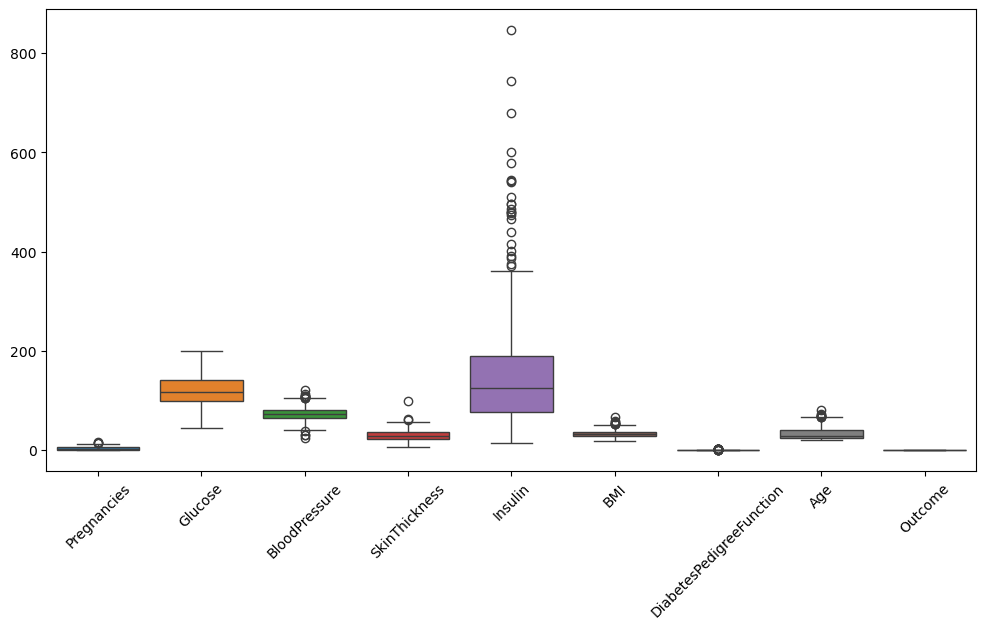

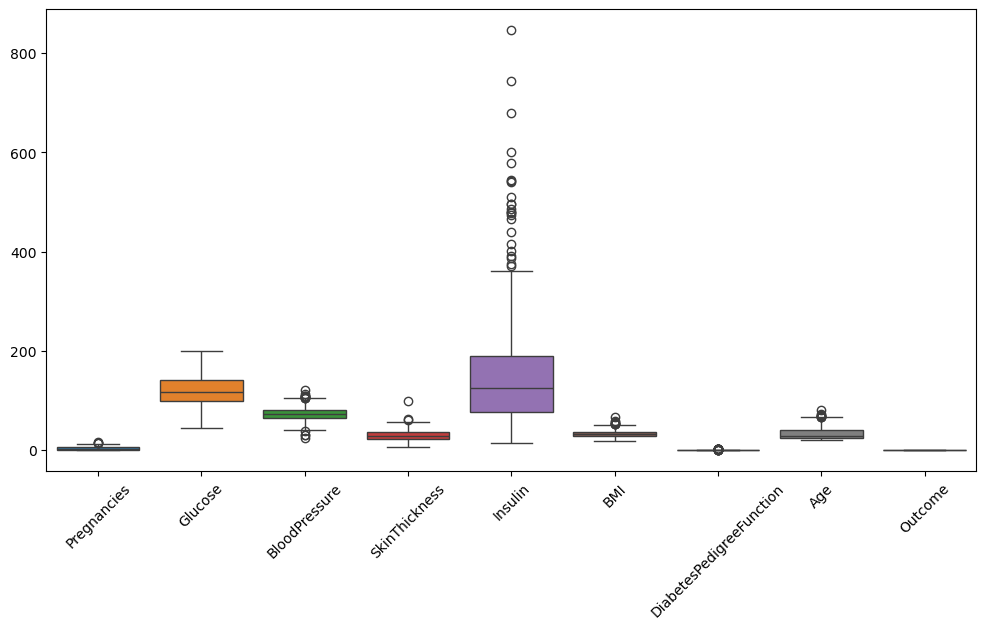

In [12]:
# prompt: plot boxplot

plt.figure(figsize=(12,6))
sns.boxplot(data=raw_data)
plt.xticks(rotation=45)
plt.show()


In [13]:
# prompt: replace 0 with median in that column

for col in problem_col:
  median = raw_data[col].median()
  raw_data[col] = raw_data[col].replace(np.nan, median)


In [5]:
# prompt: normalize data with IQR using sklearn

from sklearn.preprocessing import RobustScaler
robust = RobustScaler()
robust_df = robust.fit_transform(raw_data)
robust_df = pd.DataFrame(robust_df, columns=raw_data.columns)
robust_df.head()


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.6,0.751515,0.000000,0.37500,-0.239686,0.172043,0.665359,1.235294,1.0
1,-0.4,-0.775758,-0.333333,0.18750,-0.239686,-0.580645,-0.056209,0.117647,0.0
2,1.0,1.600000,-0.444444,-0.71875,-0.239686,-0.935484,0.783007,0.176471,1.0
3,-0.4,-0.678788,-0.333333,0.00000,0.499018,-0.419355,-0.537255,-0.470588,0.0
4,-0.6,0.484848,-1.777778,0.37500,1.080550,1.193548,5.007843,0.235294,1.0


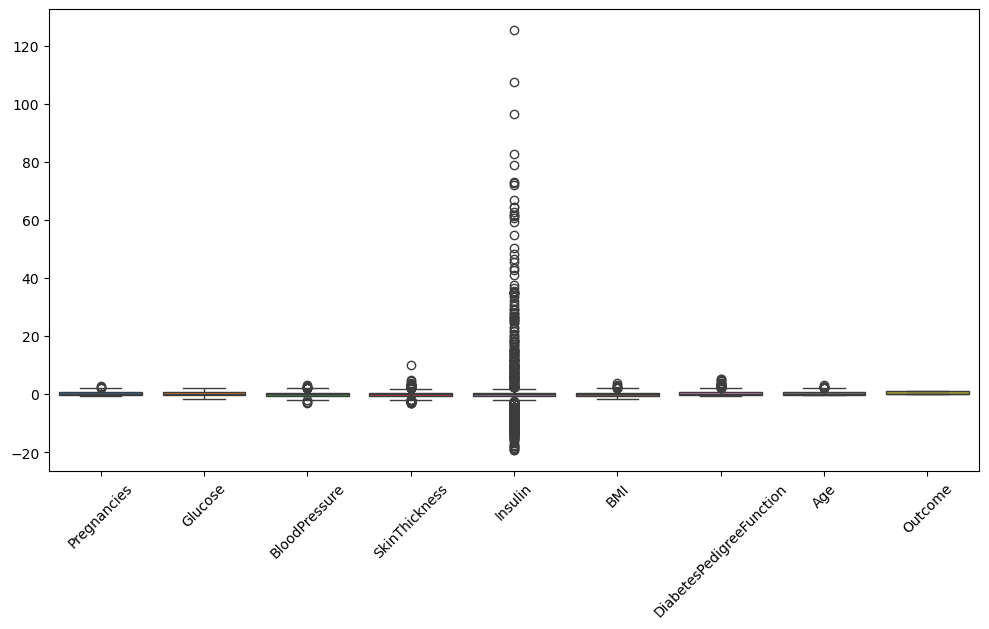

In [15]:
# prompt: plot boxplot

plt.figure(figsize=(12,6))
sns.boxplot(data=robust_df)
plt.xticks(rotation=45)
plt.show()


In [6]:
# prompt: create and train MLP from sklearn

from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

X = robust_df.drop('Outcome', axis=1)
y = robust_df['Outcome']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)

y_pred = mlp.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

         0.0       0.77      0.80      0.79        99
         1.0       0.62      0.58      0.60        55

    accuracy                           0.72       154
   macro avg       0.69      0.69      0.69       154
weighted avg       0.72      0.72      0.72       154



In [17]:
# prompt: try gridsearchcv to find the best model

from sklearn.model_selection import GridSearchCV

param_grid = {
  'hidden_layer_sizes': [(50,), (100,), (50, 50)],
  'alpha': [0.0001, 0.001, 0.01]
}

grid_search = GridSearchCV(MLPClassifier(max_iter=1000, random_state=42), param_grid, cv=5)
grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)

best_mlp = grid_search.best_estimator_
y_pred = best_mlp.predict(X_test)
print(classification_report(y_test, y_pred))


c:\Users\User\anaconda3\envs\ai_workshop\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\User\anaconda3\envs\ai_workshop\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\User\anaconda3\envs\ai_workshop\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\User\anaconda3\envs\ai_workshop\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\U

Best parameters found:  {'alpha': 0.001, 'hidden_layer_sizes': (50,)}
              precision    recall  f1-score   support

         0.0       0.80      0.79      0.80        99
         1.0       0.63      0.65      0.64        55

    accuracy                           0.74       154
   macro avg       0.72      0.72      0.72       154
weighted avg       0.74      0.74      0.74       154



In [7]:
# prompt: hide warning

import warnings
warnings.filterwarnings('ignore')


# Preprocessing

In [8]:
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

In [20]:
cols = ["Glucose","BloodPressure","SkinThickness","BMI"]
raw_data[cols] = raw_data[cols].replace({0:np.nan})

In [21]:
X=raw_data.drop(['Outcome'],axis=1)
y=raw_data['Outcome'].values

X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3,random_state=50)

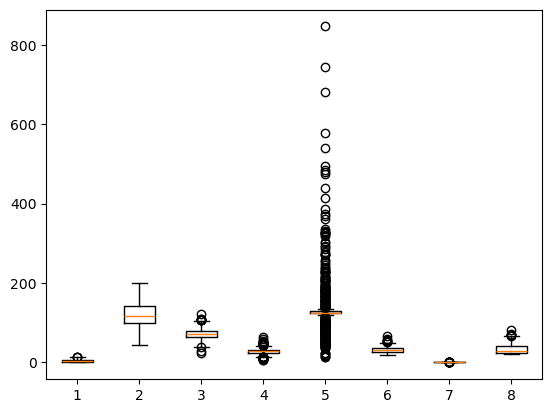

In [22]:
_ =plt.boxplot(X_train)

In [23]:
imp = SimpleImputer(missing_values=np.nan, strategy='median')
imp.fit(X_train)
X_train=imp.transform(X_train)

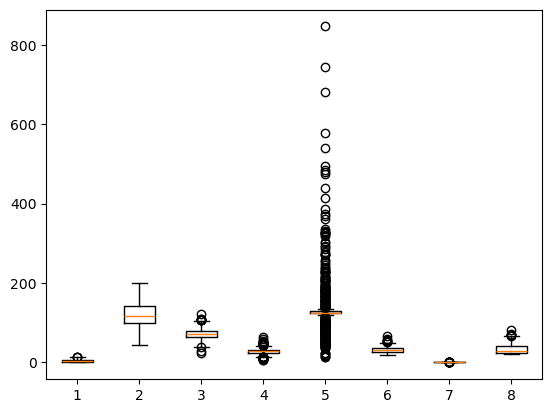

In [24]:
_ =plt.boxplot(X_train)

In [25]:
from sklearn.preprocessing import RobustScaler
scale = RobustScaler().fit(X_train)
X_train=scale.transform(X_train)

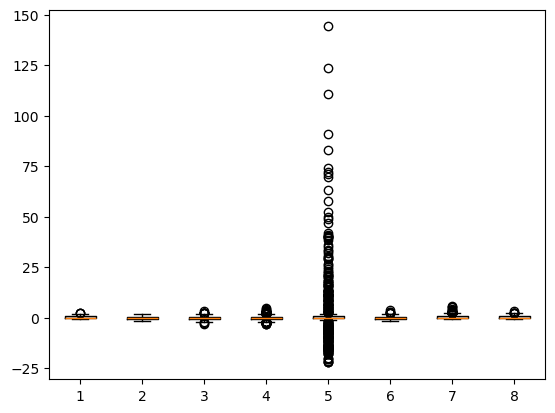

In [26]:
_ = plt.boxplot(X_train)

## Model training and evaluation

In [27]:
X_test_clean=imp.transform(X_test)
X_test_clean=scale.transform(X_test_clean)

In [28]:
# prompt: try more machine learning models from sklearn

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier


# Logistic Regression
lr_model =LogisticRegression()
lr_model.fit(X_train,y_train)
y_pred = lr_model.predict(X_test_clean)
print("Classification report for Logistic Regression:\n", classification_report(y_test, y_pred))

# Decision Tree
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
y_pred = dt_model.predict(X_test_clean)
print("Classification report for Decision Tree:\n", classification_report(y_test, y_pred))

# Random Forest
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test_clean)
print("Classification report for Random Forest:\n", classification_report(y_test, y_pred))


# Gradient Boosting
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)
y_pred = gb_model.predict(X_test_clean)
print("Classification report for Gradient Boosting:\n", classification_report(y_test, y_pred))

# AdaBoost
ab_model = AdaBoostClassifier()
ab_model.fit(X_train, y_train)
y_pred = ab_model.predict(X_test_clean)
print("Classification report for AdaBoost:\n", classification_report(y_test, y_pred))

# Support Vector Machine
svm_model = SVC()
svm_model.fit(X_train, y_train)
y_pred = svm_model.predict(X_test_clean)
print("Classification report forSupport Vector Machine:\n", classification_report(y_test, y_pred))

# K-Nearest Neighbors
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
y_pred = knn_model.predict(X_test_clean)
print("Classification report for K-Nearest Neighbors:\n", classification_report(y_test, y_pred))

# Multi layer perceptron (MLP)
mlp_model = MLPClassifier()
mlp_model.fit(X_train, y_train)
y_pred = mlp_model.predict(X_test_clean)
print("Classification report for Multi layer perceptron:\n", classification_report(y_test, y_pred))

Classification report for Logistic Regression:
               precision    recall  f1-score   support

           0       0.76      0.90      0.83       148
           1       0.74      0.51      0.60        83

    accuracy                           0.76       231
   macro avg       0.75      0.70      0.71       231
weighted avg       0.75      0.76      0.74       231

Classification report for Decision Tree:
               precision    recall  f1-score   support

           0       0.76      0.78      0.77       148
           1       0.58      0.55      0.57        83

    accuracy                           0.70       231
   macro avg       0.67      0.67      0.67       231
weighted avg       0.69      0.70      0.70       231

Classification report for Random Forest:
               precision    recall  f1-score   support

           0       0.79      0.86      0.82       148
           1       0.70      0.59      0.64        83

    accuracy                           0.76       

## Gridsearch

In [29]:
from sklearn.model_selection import GridSearchCV

In [30]:
# prompt: apply gridsearch for the Random Forest

# Grid Search for Random Forest
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10]
}

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)

best_rf_model = grid_search.best_estimator_
y_pred = best_rf_model.predict(X_test_clean)
print("Classification report for best Random Forest:\n", classification_report(y_test, y_pred))


Best parameters: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 50}
Classification report for best Random Forest:
               precision    recall  f1-score   support

           0       0.78      0.89      0.83       148
           1       0.74      0.54      0.62        83

    accuracy                           0.77       231
   macro avg       0.76      0.72      0.73       231
weighted avg       0.76      0.77      0.76       231



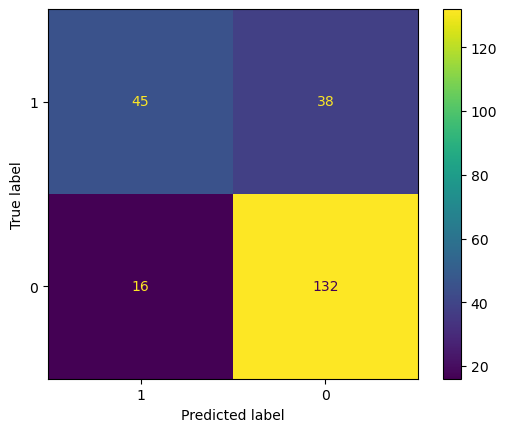

In [31]:
cm=confusion_matrix(y_test,y_pred,labels=[1,0])
ConfusionMatrixDisplay(cm,display_labels=['1','0']).plot()

## Prepare pipeline
Pipeline เป็นโมเดลที่ประกอบด้วยหลายโมเดลที่นำมาวางต่อกันเป็น step โดยจะทำงานตามลำดับของโมเดลที่อยู่ใน step ตั้งแต่ต้นจนจบ

In [ ]:
# prompt: include all reqire step for rf_model in pipline

from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', RobustScaler()),
    ('classifier', RandomForestClassifier(n_estimators=50, max_depth=10, min_samples_split=5))
])


In [ ]:
raw_data = pd.read_csv('https://github.com/praisan/hello-world/raw/master/diabetes.csv')
cols = ["Glucose","BloodPressure","SkinThickness","BMI"]
raw_data[cols] = raw_data[cols].replace({0:np.nan})
X=raw_data.drop(['Outcome'],axis=1)
y=raw_data['Outcome'].values

X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3,random_state=50)

In [ ]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('scaler', RobustScaler()),
                ('classifier',
                 RandomForestClassifier(max_depth=10, min_samples_split=5,
                                        n_estimators=50))])

In [ ]:
X_test.to_csv('X_test.csv', index=False)

In [ ]:
# prompt: save the pipeline

import joblib
joblib.dump(pipeline, 'diabetes.pkl')


['diabetes.pkl']

In [ ]:
# prompt: load the diabetes.pkl

loaded_model = joblib.load('diabetes.pkl')

In [ ]:
# prompt: read X_test.csv and predict using loaded_model

import pandas as pd
# Read X_test.csv
X_test = pd.read_csv('X_test.csv')

# Make predictions using the loaded model
y_pred = loaded_model.predict(X_test)

# Print the predictions
print(y_pred)


[0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0
 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 1 0 0 0 0
 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 1
 1 0 1 0 0 0 0 1 0 0 1 1 0 1 0 0 1 1 0 1 1 1 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0
 1 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0
 1 0 0 1 1 0 1 1 0]


In [ ]:
print("Classification report for diabetes classification:\n", classification_report(y_test, y_pred))

Classification report for diabetes classification:
               precision    recall  f1-score   support

           0       0.76      0.86      0.80       148
           1       0.67      0.51      0.58        83

    accuracy                           0.73       231
   macro avg       0.71      0.68      0.69       231
weighted avg       0.72      0.73      0.72       231



# Lab02
1. หาโมเดลที่ดีที่สุดสำหรับการทำนายลูกค้าย้ายค่าย
2. สร้าง pipeline แล้วบันทึกเพื่อการนำไปใช้งานได้สะดวก พร้อมทดลองใช้


In [9]:
raw_data = pd.read_csv('https://github.com/praisan/hello-world/raw/master/churn_data.csv', delimiter=',')
X = raw_data.drop(['AccountLength',	'State',	'AreaCode',	'Phone',	'Churn'], axis=1)
y=np.ravel(raw_data['Churn'])

In [ ]:
profile = ProfileReport(raw_data, title="Profiling Report")
profile

In [16]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   VMailMessage   3333 non-null   int64  
 1   DayMins        3333 non-null   float64
 2   EveMins        3333 non-null   float64
 3   NightMins      3333 non-null   float64
 4   IntlMins       3333 non-null   float64
 5   CustServCalls  3333 non-null   int64  
 6   IntPlan        3333 non-null   int64  
 7   VMailPlan      3333 non-null   int64  
 8   DayCalls       3333 non-null   int64  
 9   DayCharge      3333 non-null   float64
 10  EveCalls       3333 non-null   int64  
 11  EveCharge      3333 non-null   float64
 12  NightCalls     3333 non-null   int64  
 13  NightCharge    3333 non-null   float64
 14  IntlCalls      3333 non-null   int64  
 15  IntlCharge     3333 non-null   float64
dtypes: float64(8), int64(8)
memory usage: 416.8 KB


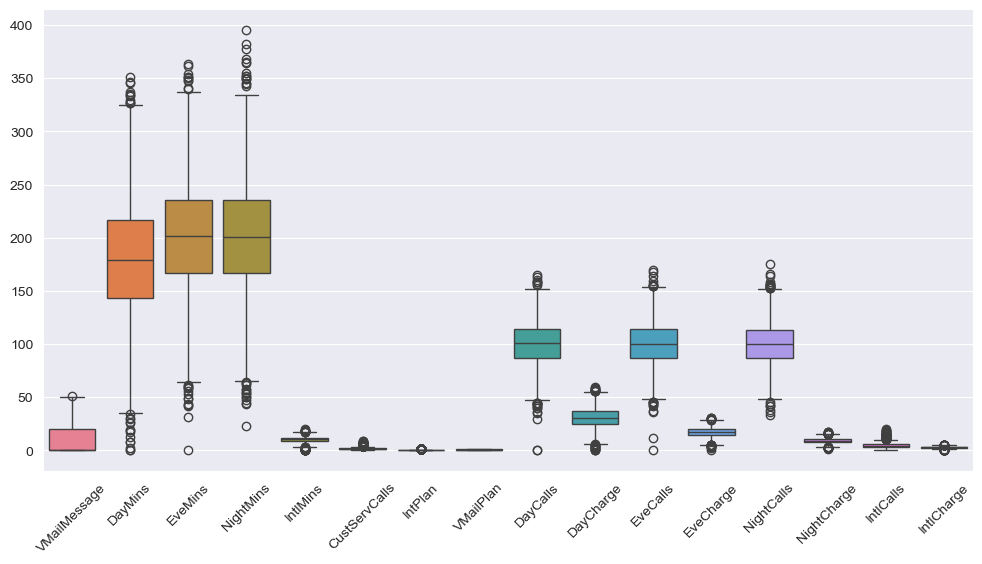

In [17]:
plt.figure(figsize=(12,6))
sns.boxplot(data=X)
plt.xticks(rotation=45)
plt.show()

In [36]:
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.2,random_state=50)

In [26]:
from sklearn.preprocessing import RobustScaler
robust = RobustScaler()
X_train = robust.fit_transform(X_train)
# X_scaled = pd.DataFrame(X_scaled, columns=X.columns)
# X_scaled.head()

In [27]:
X_test_clean = robust.transform(X_test)

In [28]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier


# Logistic Regression
lr_model =LogisticRegression()
lr_model.fit(X_train,y_train)
y_pred = lr_model.predict(X_test_clean)
print("Classification report for Logistic Regression:\n", classification_report(y_test, y_pred))

# Decision Tree
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
y_pred = dt_model.predict(X_test_clean)
print("Classification report for Decision Tree:\n", classification_report(y_test, y_pred))

# Random Forest
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test_clean)
print("Classification report for Random Forest:\n", classification_report(y_test, y_pred))


# Gradient Boosting
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)
y_pred = gb_model.predict(X_test_clean)
print("Classification report for Gradient Boosting:\n", classification_report(y_test, y_pred))

# AdaBoost
ab_model = AdaBoostClassifier()
ab_model.fit(X_train, y_train)
y_pred = ab_model.predict(X_test_clean)
print("Classification report for AdaBoost:\n", classification_report(y_test, y_pred))

# Support Vector Machine
svm_model = SVC()
svm_model.fit(X_train, y_train)
y_pred = svm_model.predict(X_test_clean)
print("Classification report forSupport Vector Machine:\n", classification_report(y_test, y_pred))

# K-Nearest Neighbors
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
y_pred = knn_model.predict(X_test_clean)
print("Classification report for K-Nearest Neighbors:\n", classification_report(y_test, y_pred))

# Multi layer perceptron (MLP)
mlp_model = MLPClassifier()
mlp_model.fit(X_train, y_train)
y_pred = mlp_model.predict(X_test_clean)
print("Classification report for Multi layer perceptron:\n", classification_report(y_test, y_pred))

Classification report for Logistic Regression:
               precision    recall  f1-score   support

           0       0.87      0.97      0.92       561
           1       0.59      0.21      0.31       106

    accuracy                           0.85       667
   macro avg       0.73      0.59      0.61       667
weighted avg       0.82      0.85      0.82       667

Classification report for Decision Tree:
               precision    recall  f1-score   support

           0       0.95      0.94      0.95       561
           1       0.71      0.76      0.74       106

    accuracy                           0.91       667
   macro avg       0.83      0.85      0.84       667
weighted avg       0.92      0.91      0.91       667

Classification report for Random Forest:
               precision    recall  f1-score   support

           0       0.96      0.99      0.97       561
           1       0.94      0.76      0.84       106

    accuracy                           0.96       

In [31]:
from sklearn.model_selection import GridSearchCV

In [32]:
# Grid Search for Random Forest
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10]
}

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)

best_rf_model = grid_search.best_estimator_
y_pred = best_rf_model.predict(X_test_clean)
print("Classification report for best Random Forest:\n", classification_report(y_test, y_pred))


Best parameters: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 200}
Classification report for best Random Forest:
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       561
           1       0.95      0.79      0.87       106

    accuracy                           0.96       667
   macro avg       0.96      0.89      0.92       667
weighted avg       0.96      0.96      0.96       667



In [34]:
from sklearn.pipeline import Pipeline

In [35]:
pipeline = Pipeline([
    ('scaler', RobustScaler()),
    ('classifier', RandomForestClassifier(n_estimators=200, max_depth=None, min_samples_split=5))
])

In [37]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', RobustScaler()),
                ('classifier',
                 RandomForestClassifier(min_samples_split=5,
                                        n_estimators=200))])

In [40]:
y_pred = pipeline.predict(X_test)
print("Classification report for diabetes classification:\n", classification_report(y_test, y_pred))

Classification report for diabetes classification:
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       561
           1       0.95      0.77      0.85       106

    accuracy                           0.96       667
   macro avg       0.96      0.88      0.91       667
weighted avg       0.96      0.96      0.96       667

